In [1]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import time
import random
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
from iso639 import languages
import user_agents
from ip2geotools.databases.noncommercial import DbIpCity as ip2geo
import requests
import json
from geopy.distance import great_circle
from geopy.geocoders import Nominatim
from datasist.structdata import detect_outliers
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder
from category_encoders import BinaryEncoder as ce
from datetime import datetime
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler 
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import r2_score , mean_squared_error , classification_report ,recall_score , precision_score , ConfusionMatrixDisplay , confusion_matrix
from sklearn.linear_model import Ridge , Lasso
from sklearn.tree import DecisionTreeRegressor , DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestRegressor , RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB , GaussianNB , BernoulliNB
from sklearn.svm import SVC , SVR
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier 
import xgboost as xgb
import pickle
%matplotlib inline


In [2]:
#import data
df=pd.read_csv('Churn_Modelling.csv')
df.sample(5)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
264,265,15700696,Kang,738,Spain,Male,31,9,79019.80,1,1,1,18606.23,0
2715,2716,15682547,Lucchese,649,France,Male,38,1,122214.00,1,0,1,88965.46,0
7531,7532,15642063,Kelechi,692,France,Male,40,6,163505.16,1,0,0,90424.09,0
1750,1751,15569410,Tang,601,Germany,Female,33,7,114430.18,2,1,1,153012.13,0
3679,3680,15593897,Carr,650,Spain,Male,25,7,160599.06,2,1,1,28391.52,0


In [3]:
#cleansing
#investing
df.shape

(10000, 14)

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
RowNumber,10000.0,5.000500e+03,2886.895680,1.00,2500.75,5.000500e+03,7.500250e+03,10000.00
CustomerId,10000.0,1.569094e+07,71936.186123,15565701.00,15628528.25,1.569074e+07,1.575323e+07,15815690.00
CreditScore,10000.0,6.505288e+02,96.653299,350.00,584.00,6.520000e+02,7.180000e+02,850.00
Age,10000.0,3.892180e+01,10.487806,18.00,32.00,3.700000e+01,4.400000e+01,92.00
Tenure,10000.0,5.012800e+00,2.892174,0.00,3.00,5.000000e+00,7.000000e+00,10.00
Balance,10000.0,7.648589e+04,62397.405202,0.00,0.00,9.719854e+04,1.276442e+05,250898.09
NumOfProducts,10000.0,1.530200e+00,0.581654,1.00,1.00,1.000000e+00,2.000000e+00,4.00
HasCrCard,10000.0,7.055000e-01,0.455840,0.00,0.00,1.000000e+00,1.000000e+00,1.00
IsActiveMember,10000.0,5.151000e-01,0.499797,0.00,0.00,1.000000e+00,1.000000e+00,1.00
EstimatedSalary,10000.0,1.000902e+05,57510.492818,11.58,51002.11,1.001939e+05,1.493882e+05,199992.48


In [5]:
df.describe(include='O').T

,count,unique,top,freq
Surname,10000,2932,Smith,32
Geography,10000,3,France,5014
Gender,10000,2,Male,5457


In [6]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
RowNumber,10000.0,NaN,NaN,NaN,5000.5,2886.89568,1.0,2500.75,5000.5,7500.25,10000.0
CustomerId,10000.0,NaN,NaN,NaN,15690940.5694,71936.186123,15565701.0,15628528.25,15690738.0,15753233.75,15815690.0
Surname,10000,2932,Smith,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CreditScore,10000.0,NaN,NaN,NaN,650.5288,96.653299,350.0,584.0,652.0,718.0,850.0
Geography,10000,3,France,5014,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,10000,2,Male,5457,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,10000.0,NaN,NaN,NaN,38.9218,10.487806,18.0,32.0,37.0,44.0,92.0
Tenure,10000.0,NaN,NaN,NaN,5.0128,2.892174,0.0,3.0,5.0,7.0,10.0
Balance,10000.0,NaN,NaN,NaN,76485.889288,62397.405202,0.0,0.0,97198.54,127644.24,250898.09
NumOfProducts,10000.0,NaN,NaN,NaN,1.5302,0.581654,1.0,1.0,1.0,2.0,4.0


In [7]:
df.dtypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [9]:
#check duplicates
df.duplicated().sum()

0

In [10]:
#check missing value
df.isna().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [11]:
#check columns
#rename columns
df.columns=df.columns.str.lower().str.strip().str.replace(" ","_")
df.columns

Index(['rownumber', 'customerid', 'surname', 'creditscore', 'geography',
       'gender', 'age', 'tenure', 'balance', 'numofproducts', 'hascrcard',
       'isactivemember', 'estimatedsalary', 'exited'],
      dtype='object')

In [12]:
#drop unnecessary columns
#no need for  prediction phase
df.drop(['rownumber', 'customerid'],axis=1,inplace=True)

In [13]:
#check rows 
#check unique id and logic
#check object
for i in  df.select_dtypes('object'):
    print(f'for {i} : \n',df[i].value_counts())
    print('-'*60)

for surname : 
 Smith       32
Scott       29
Martin      29
Walker      28
Brown       26
            ..
Izmailov     1
Bold         1
Bonham       1
Poninski     1
Burbidge     1
Name: surname, Length: 2932, dtype: int64
------------------------------------------------------------
for geography : 
 France     5014
Germany    2509
Spain      2477
Name: geography, dtype: int64
------------------------------------------------------------
for gender : 
 Male      5457
Female    4543
Name: gender, dtype: int64
------------------------------------------------------------


In [14]:
#check numeric
df.describe().T

,count,mean,std,min,25%,50%,75%,max
creditscore,10000.0,650.528800,96.653299,350.00,584.00,652.000,718.0000,850.00
age,10000.0,38.921800,10.487806,18.00,32.00,37.000,44.0000,92.00
tenure,10000.0,5.012800,2.892174,0.00,3.00,5.000,7.0000,10.00
balance,10000.0,76485.889288,62397.405202,0.00,0.00,97198.540,127644.2400,250898.09
numofproducts,10000.0,1.530200,0.581654,1.00,1.00,1.000,2.0000,4.00
hascrcard,10000.0,0.705500,0.455840,0.00,0.00,1.000,1.0000,1.00
isactivemember,10000.0,0.515100,0.499797,0.00,0.00,1.000,1.0000,1.00
estimatedsalary,10000.0,100090.239881,57510.492818,11.58,51002.11,100193.915,149388.2475,199992.48
exited,10000.0,0.203700,0.402769,0.00,0.00,0.000,0.0000,1.00


In [15]:
#no feature engineering , string operation , datetime feature , web users and no geo spatial feature

In [16]:
#detec and handle outliers 
#no outlier needed to be deleted

In [17]:
#data understanding
#univariate analysis
df.columns

Index(['surname', 'creditscore', 'geography', 'gender', 'age', 'tenure',
       'balance', 'numofproducts', 'hascrcard', 'isactivemember',
       'estimatedsalary', 'exited'],
      dtype='object')

In [18]:
for i in df.columns:
    print()
    fig=px.histogram(df,i,title=f'{i}',color_discrete_sequence=['blue'],marginal='box',text_auto=True)
    fig.update_layout(title_x=0.5)
    fig.show()
    print("-------------------------------------------------------------------------------")

-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------


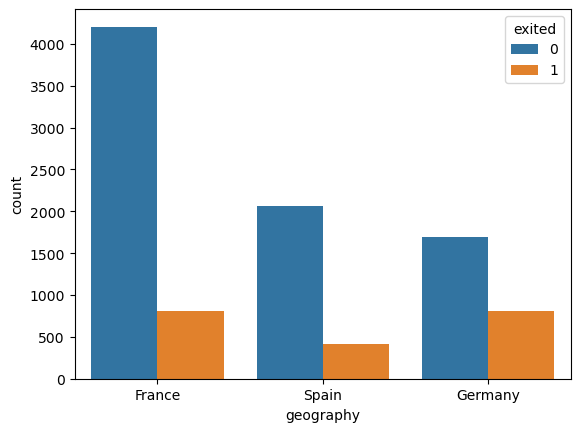

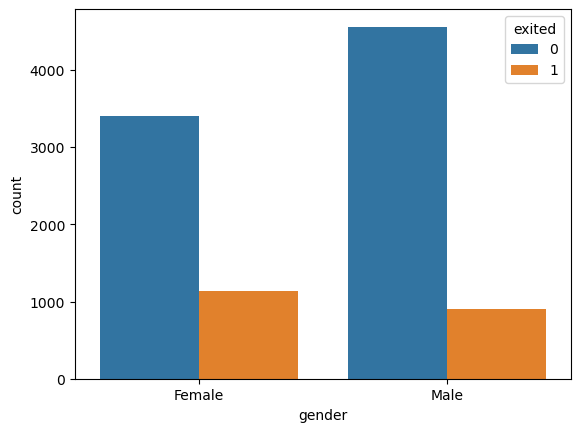

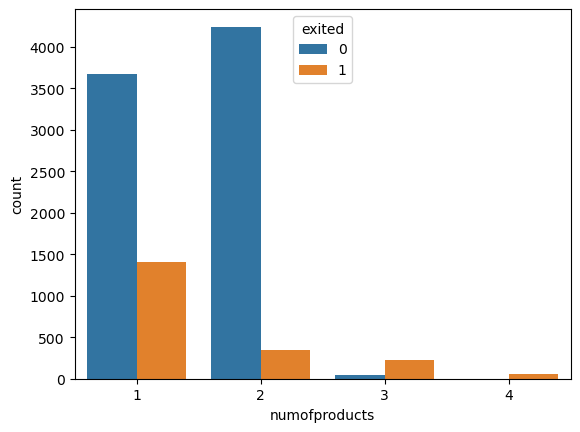

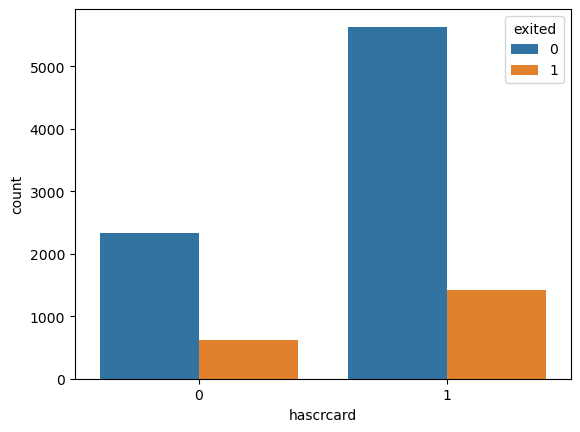

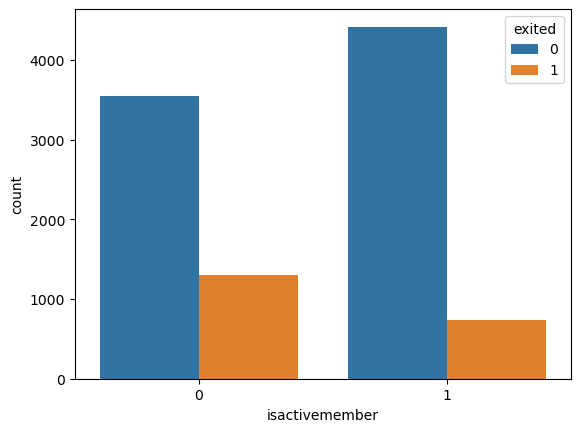

<Figure size 640x480 with 0 Axes>

In [19]:
#bivariete analysis
#for object
df.drop('surname',axis=1,inplace=True)
df.columns
lst=df.select_dtypes('object').columns.to_list() + ['numofproducts', 'hascrcard', 'isactivemember']
#for i in df.select_dtypes('object').columns.to_list()
for i in lst :    
    if i == 'exited' :
        continue 
    else :    
        sns.countplot(data=df,x=f'{i}',hue='exited')
        plt.figure()
        

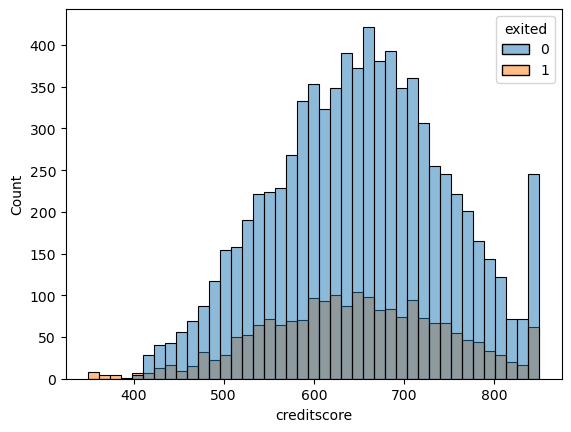

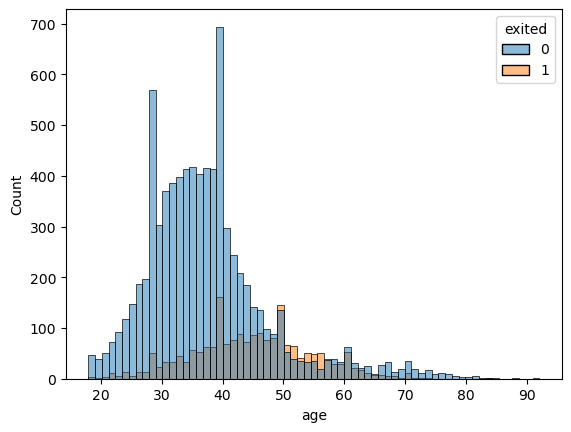

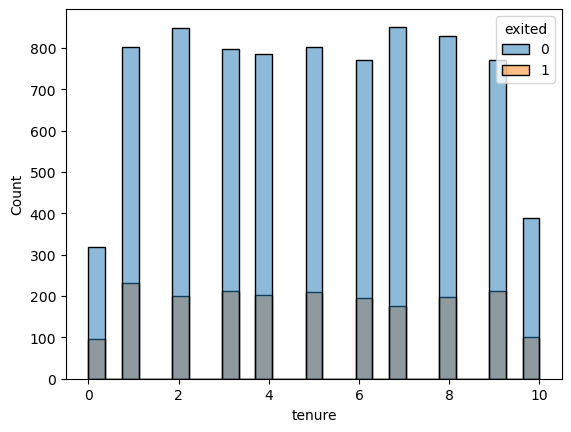

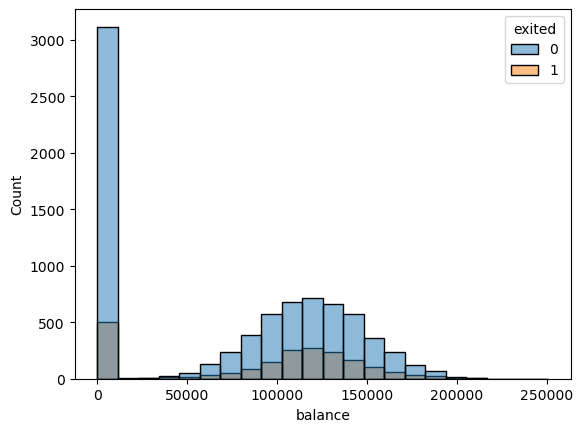

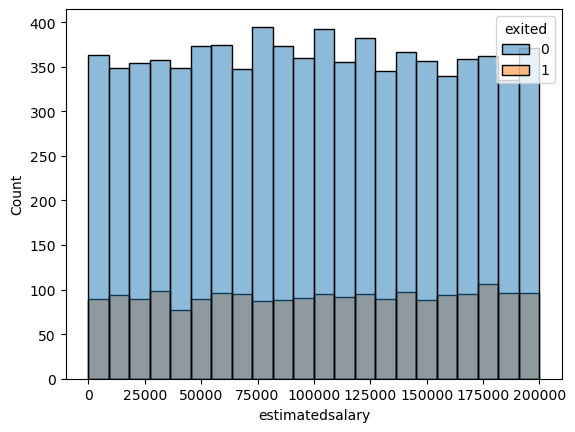

<Figure size 640x480 with 0 Axes>

In [20]:
#for numeric
lst=df.select_dtypes('number').columns.to_list()
removed=['numofproducts', 'hascrcard', 'isactivemember']
for i in removed :
    lst.remove(i)
#for i in df.select_dtypes('number').columns.to_list()
for i in lst :
    if i == 'exited':
        continue
    else :    
        sns.histplot(data=df,x=f'{i}',hue='exited')
        plt.figure()
        

In [21]:
df.columns

Index(['creditscore', 'geography', 'gender', 'age', 'tenure', 'balance',
       'numofproducts', 'hascrcard', 'isactivemember', 'estimatedsalary',
       'exited'],
      dtype='object')

In [22]:
#bussiness insights
lst=['age', 'tenure', 'balance',
       'numofproducts','estimatedsalary']
for i in lst :    
    fig=px.scatter(df,x=f'{i}',y='creditscore',title=f'{i} vs credit score',color_discrete_sequence=['green'])
    fig.update_layout(title_x=0.5)
    fig.show()
        

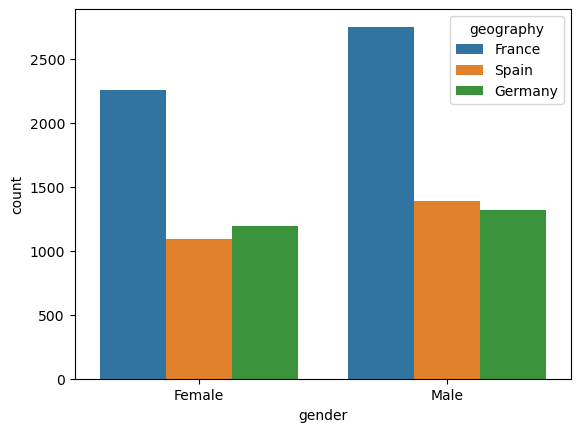

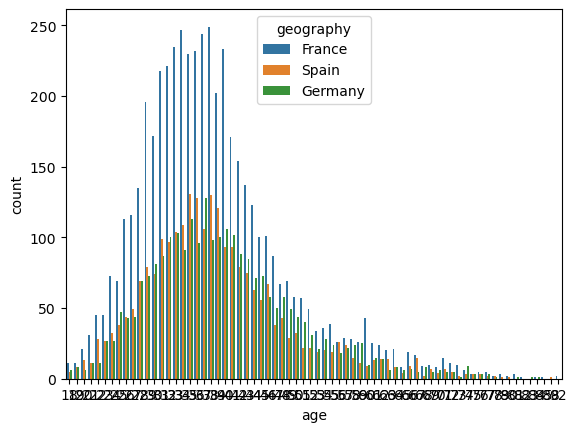

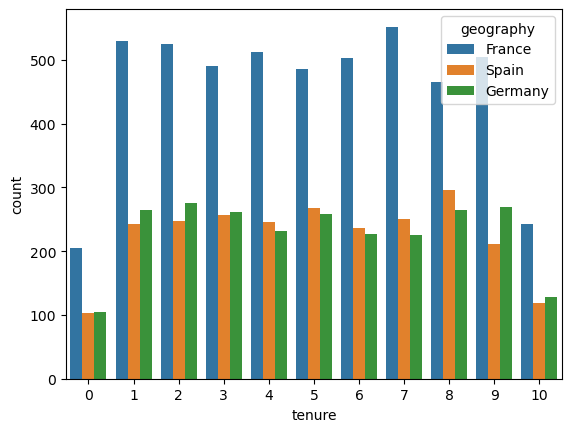

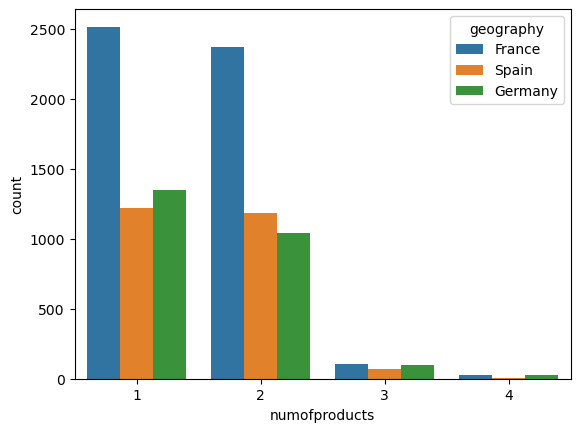

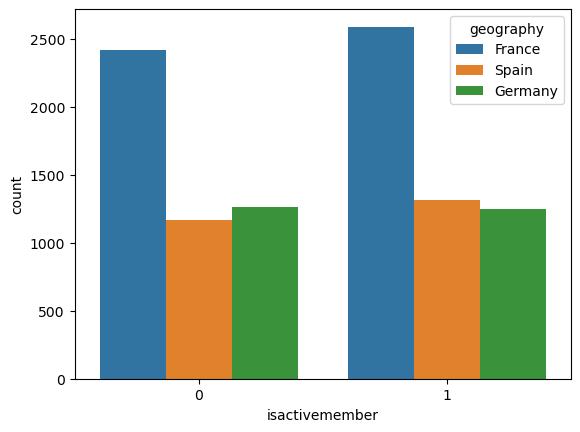

<Figure size 640x480 with 0 Axes>

In [23]:
lst=['gender', 'age', 'tenure', 
       'numofproducts',  'isactivemember']
for i in lst :    
    sns.countplot(data=df,x=f'{i}',hue='geography')
    plt.figure()
        

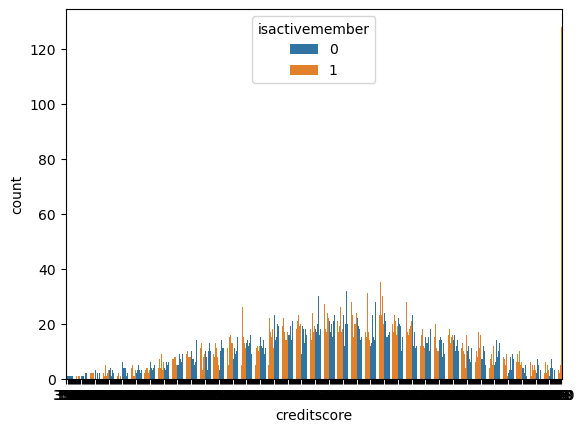

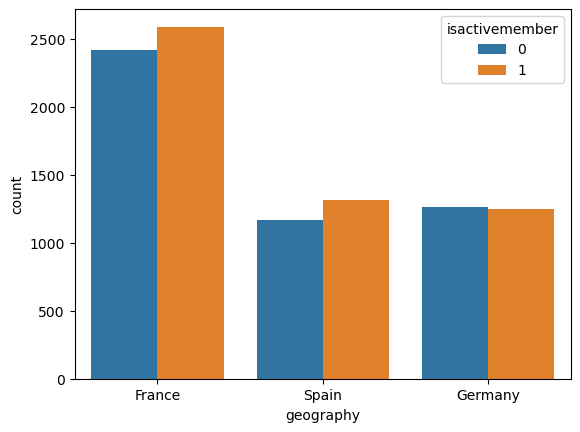

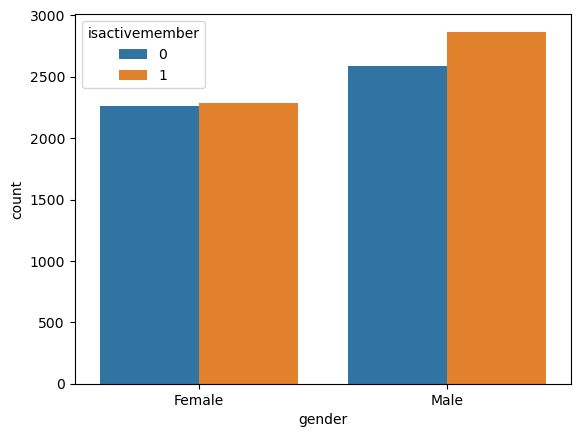

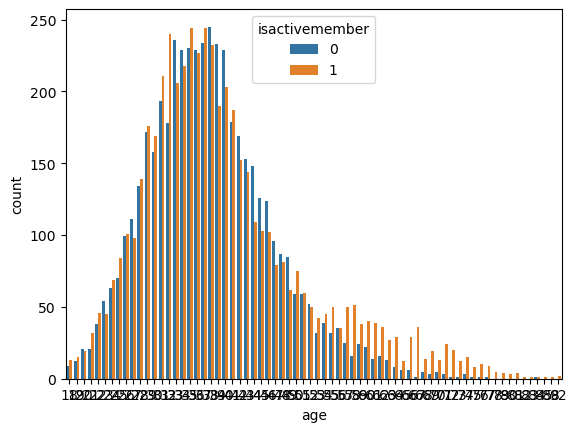

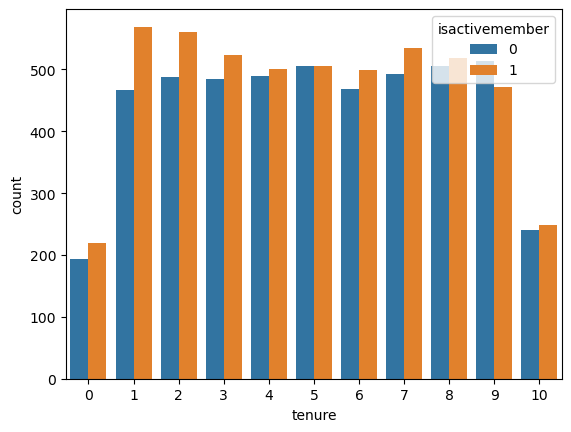

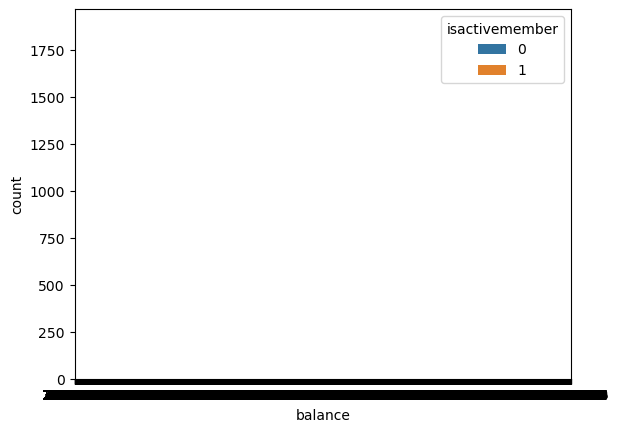

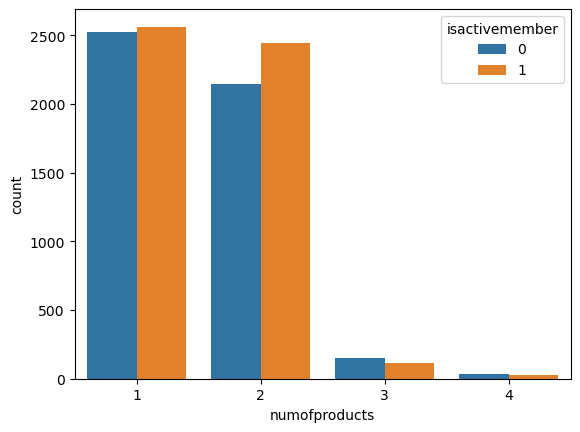

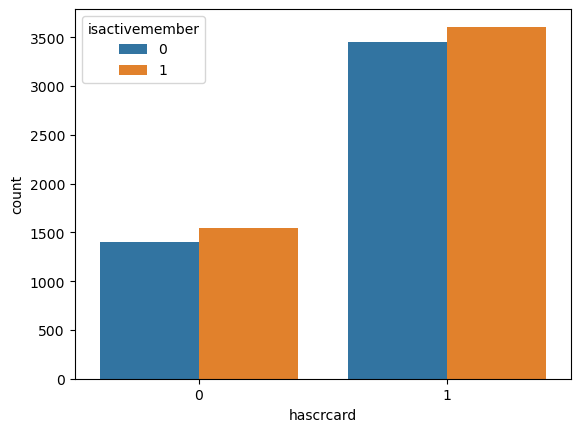

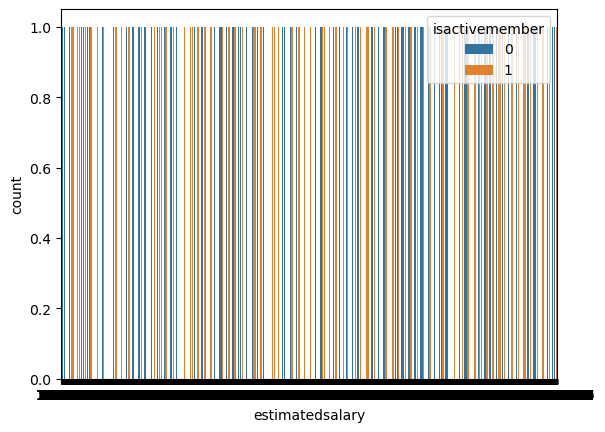

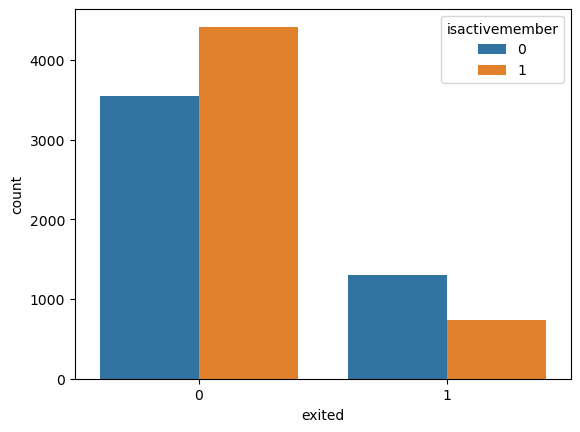

<Figure size 640x480 with 0 Axes>

In [24]:
for i in df.columns :   
    if i == 'isactivemember':
        continue
    else :    
        sns.countplot(data=df,x=f'{i}',hue='isactivemember')
        plt.figure()

<AxesSubplot:>

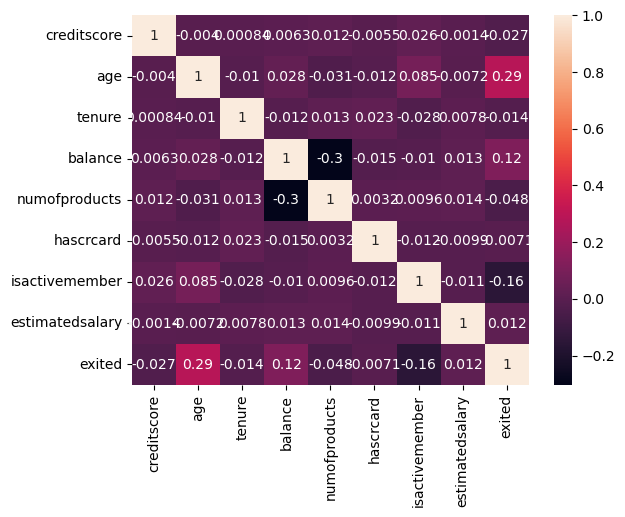

In [25]:
#correlation
sns.heatmap(df.select_dtypes('number').corr(), annot=True )

In [26]:
#encoding
#work with categorical data 
#check and decide the encoding stategy
#update objects list
lst_obj=[]
for i in df.select_dtypes('object') :
    lst_obj.append(i)
for i in lst_obj:
    print(f"for feature {i} : ",df[i].nunique())
    print()

for feature geography :  3

for feature gender :  2



In [27]:
#create restore point
df_c=df.copy()
df_c.isna().sum()

creditscore        0
geography          0
gender             0
age                0
tenure             0
balance            0
numofproducts      0
hascrcard          0
isactivemember     0
estimatedsalary    0
exited             0
dtype: int64

In [28]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   creditscore      10000 non-null  int64  
 1   geography        10000 non-null  object 
 2   gender           10000 non-null  object 
 3   age              10000 non-null  int64  
 4   tenure           10000 non-null  int64  
 5   balance          10000 non-null  float64
 6   numofproducts    10000 non-null  int64  
 7   hascrcard        10000 non-null  int64  
 8   isactivemember   10000 non-null  int64  
 9   estimatedsalary  10000 non-null  float64
 10  exited           10000 non-null  int64  
dtypes: float64(2), int64(7), object(2)
memory usage: 859.5+ KB


In [29]:
#work with nominal
#create one hot enconding object
ohe = OneHotEncoder(sparse=False)
df_ohe = pd.DataFrame(ohe.fit_transform(df_c[lst_obj]) , columns=ohe.get_feature_names_out())
df_ohe

,geography_France,geography_Germany,geography_Spain,gender_Female,gender_Male
0,1.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,1.0,0.0
2,1.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...
9995,1.0,0.0,0.0,0.0,1.0
9996,1.0,0.0,0.0,0.0,1.0
9997,1.0,0.0,0.0,1.0,0.0
9998,0.0,1.0,0.0,0.0,1.0


In [30]:
df_c=pd.concat([df_c,df_ohe],axis=1)
df_c.drop(lst_obj,axis=1,inplace=True)
df_c

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited,geography_France,geography_Germany,geography_Spain,gender_Female,gender_Male
0,619,42,2,0.00,1,1,1,101348.88,1,1.0,0.0,0.0,1.0,0.0
1,608,41,1,83807.86,1,0,1,112542.58,0,0.0,0.0,1.0,1.0,0.0
2,502,42,8,159660.80,3,1,0,113931.57,1,1.0,0.0,0.0,1.0,0.0
3,699,39,1,0.00,2,0,0,93826.63,0,1.0,0.0,0.0,1.0,0.0
4,850,43,2,125510.82,1,1,1,79084.10,0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,96270.64,0,1.0,0.0,0.0,0.0,1.0
9996,516,35,10,57369.61,1,1,1,101699.77,0,1.0,0.0,0.0,0.0,1.0
9997,709,36,7,0.00,1,0,1,42085.58,1,1.0,0.0,0.0,1.0,0.0
9998,772,42,3,75075.31,2,1,0,92888.52,1,0.0,1.0,0.0,0.0,1.0


In [31]:
df_c

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited,geography_France,geography_Germany,geography_Spain,gender_Female,gender_Male
0,619,42,2,0.00,1,1,1,101348.88,1,1.0,0.0,0.0,1.0,0.0
1,608,41,1,83807.86,1,0,1,112542.58,0,0.0,0.0,1.0,1.0,0.0
2,502,42,8,159660.80,3,1,0,113931.57,1,1.0,0.0,0.0,1.0,0.0
3,699,39,1,0.00,2,0,0,93826.63,0,1.0,0.0,0.0,1.0,0.0
4,850,43,2,125510.82,1,1,1,79084.10,0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,39,5,0.00,2,1,0,96270.64,0,1.0,0.0,0.0,0.0,1.0
9996,516,35,10,57369.61,1,1,1,101699.77,0,1.0,0.0,0.0,0.0,1.0
9997,709,36,7,0.00,1,0,1,42085.58,1,1.0,0.0,0.0,1.0,0.0
9998,772,42,3,75075.31,2,1,0,92888.52,1,0.0,1.0,0.0,0.0,1.0


In [32]:
#check if there are no categorical data left
#filteration
lst_obj_c=[]
for i in df_c.columns:
    if df_c[i].dtype == 'O':
        lst_obj_c.append(i)
print(lst_obj_c)  
if len(lst_obj_c) == 0 :
    print('There is no categorical data left')
else :
    print('There is categorical data left') 

[]
There is no categorical data left


In [33]:
#split data
x , y = df_c.drop(['exited'] , axis = 1 ) , df_c['exited']
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size=0.2 , random_state=42 , stratify=y)

In [34]:
x_train

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,geography_France,geography_Germany,geography_Spain,gender_Female,gender_Male
2151,753,57,7,0.00,1,1,0,159475.08,1.0,0.0,0.0,0.0,1.0
8392,739,32,3,102128.27,1,1,0,63981.37,0.0,1.0,0.0,0.0,1.0
5006,755,37,0,113865.23,2,1,1,117396.25,0.0,1.0,0.0,1.0,0.0
4117,561,37,5,0.00,2,1,0,83093.25,1.0,0.0,0.0,0.0,1.0
7182,692,49,6,110540.43,2,0,1,107472.99,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4555,688,35,6,0.00,1,1,0,25488.43,0.0,0.0,1.0,1.0,0.0
4644,712,74,5,0.00,2,0,0,151425.82,0.0,0.0,1.0,0.0,1.0
8942,667,37,9,71786.90,2,1,1,67734.79,1.0,0.0,0.0,1.0,0.0
2935,687,35,8,100988.39,2,1,0,22247.27,0.0,0.0,1.0,0.0,1.0


In [35]:
x_test

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,geography_France,geography_Germany,geography_Spain,gender_Female,gender_Male
5702,585,36,7,0.00,2,1,0,94283.09,1.0,0.0,0.0,0.0,1.0
3667,525,33,4,131023.76,2,0,0,55072.93,0.0,1.0,0.0,0.0,1.0
1617,557,40,4,0.00,2,0,1,105433.53,0.0,0.0,1.0,1.0,0.0
5673,639,34,5,139393.19,2,0,0,33950.08,0.0,0.0,1.0,0.0,1.0
4272,640,34,3,77826.80,1,1,1,168544.85,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5768,674,36,2,154525.70,1,0,1,27468.72,1.0,0.0,0.0,0.0,1.0
833,634,37,3,111432.77,2,1,1,167032.49,0.0,1.0,0.0,0.0,1.0
9719,516,47,9,128298.74,1,0,0,149614.17,0.0,1.0,0.0,1.0,0.0
2776,689,39,7,0.00,2,0,0,14917.09,1.0,0.0,0.0,0.0,1.0


In [36]:
y_train

2151    1
8392    1
5006    0
4117    0
7182    0
       ..
4555    1
4644    0
8942    0
2935    0
6206    0
Name: exited, Length: 8000, dtype: int64

In [38]:
y_test

5702    0
3667    0
1617    0
5673    0
4272    0
       ..
5768    0
833     0
9719    1
2776    0
3776    0
Name: exited, Length: 2000, dtype: int64

In [39]:
#check the imbalancing classes of the target
print(y_train.value_counts(),'\n')
px.pie(y_train,names=y_train)

0    6370
1    1630
Name: exited, dtype: int64 



In [40]:
#handle imbalanced classes with over sampling
#create smote smapling object
oversample = RandomOverSampler()

In [41]:
#resampling
x_train , y_train= oversample.fit_resample(x_train , y_train)

In [42]:
#check again
print(y_train.value_counts(),'\n')
px.pie(y_train,names=y_train)

1    6370
0    6370
Name: exited, dtype: int64 



In [43]:
#standard scaling
#create standrad scaler object
scaler = StandardScaler()
x_train[x_train.columns] = scaler.fit_transform(x_train)
x_test[x_test.columns] = scaler.transform(x_test)

In [55]:
#modeling and evaluating ---> donot forget to scale before modeling
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
Models = [
    ('LR',LogisticRegression()),
    ('GNB',GaussianNB()),
    ('KNNC' , KNeighborsClassifier(n_neighbors=13, p=2)),
    ('SVC' , SVC()),
    ('DT' , DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=3,min_samples_split=2,min_samples_leaf=1,random_state=0)),
    ('RF' , RandomForestClassifier(n_estimators=30, criterion='gini',max_depth=6,min_samples_split=8,min_samples_leaf=2,random_state=0)),
    ('ADB',AdaBoostClassifier(n_estimators=70, learning_rate=0.5, random_state=0)),
    ('GB',GradientBoostingClassifier(n_estimators=100, learning_rate=0.3, random_state=0,max_depth=4)),
    ('XGB',xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=0,max_depth=3))
]

LR
Training set pred accuracy :  70.0 %
Test set  pred accuracy :  71.0 %
              precision    recall  f1-score   support

          No     0.6922    0.7148    0.7033      6370
         Yes     0.7051    0.6821    0.6934      6370

    accuracy                         0.6984     12740
   macro avg     0.6986    0.6984    0.6983     12740
weighted avg     0.6986    0.6984    0.6983     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9047    0.7094    0.7952      1593
         Yes     0.3835    0.7076    0.4974       407

    accuracy                         0.7090      2000
   macro avg     0.6441    0.7085    0.6463      2000
weighted avg     0.7987    0.7090    0.7346      2000

Classification report for test set : 
 None
matrix for train : 



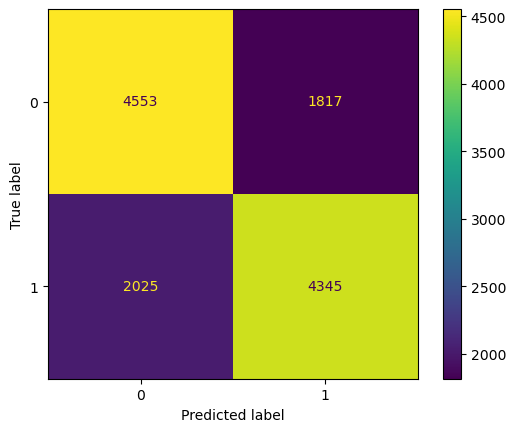

matrix for test : 



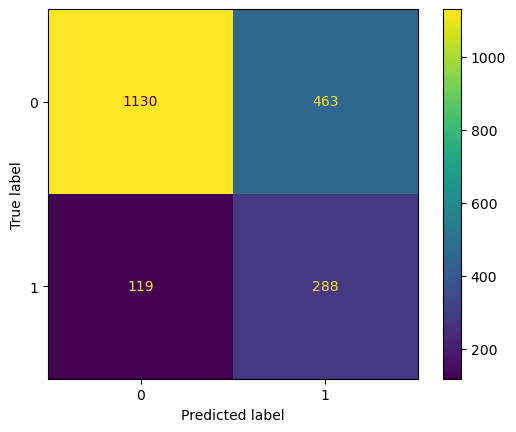

------------------------------
GNB
Training set pred accuracy :  70.0 %
Test set  pred accuracy :  71.0 %
              precision    recall  f1-score   support

          No     0.6885    0.7375    0.7121      6370
         Yes     0.7174    0.6662    0.6909      6370

    accuracy                         0.7019     12740
   macro avg     0.7029    0.7019    0.7015     12740
weighted avg     0.7029    0.7019    0.7015     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.8951    0.7232    0.8000      1593
         Yes     0.3815    0.6683    0.4857       407

    accuracy                         0.7120      2000
   macro avg     0.6383    0.6957    0.6429      2000
weighted avg     0.7906    0.7120    0.7360      2000

Classification report for test set : 
 None
matrix for train : 



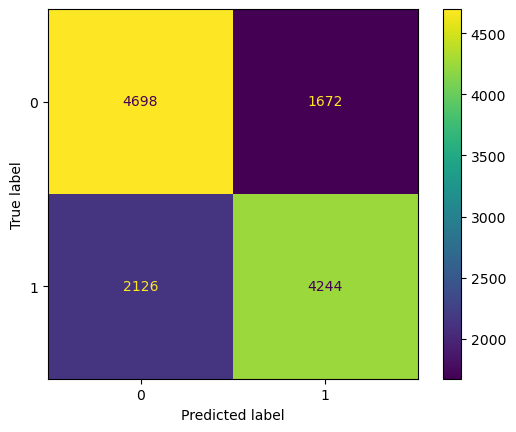

matrix for test : 



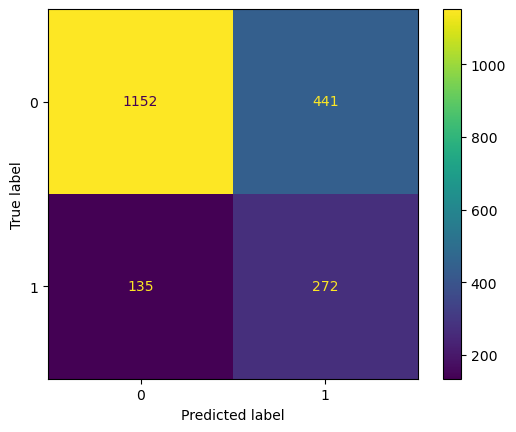

------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



KNNC
Training set pred accuracy :  82.0 %
Test set  pred accuracy :  74.0 %
              precision    recall  f1-score   support

          No     0.8352    0.7903    0.8121      6370
         Yes     0.8010    0.8441    0.8220      6370

    accuracy                         0.8172     12740
   macro avg     0.8181    0.8172    0.8171     12740
weighted avg     0.8181    0.8172    0.8171     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.8993    0.7514    0.8187      1593
         Yes     0.4081    0.6708    0.5074       407

    accuracy                         0.7350      2000
   macro avg     0.6537    0.7111    0.6631      2000
weighted avg     0.7994    0.7350    0.7554      2000

Classification report for test set : 
 None
matrix for train : 



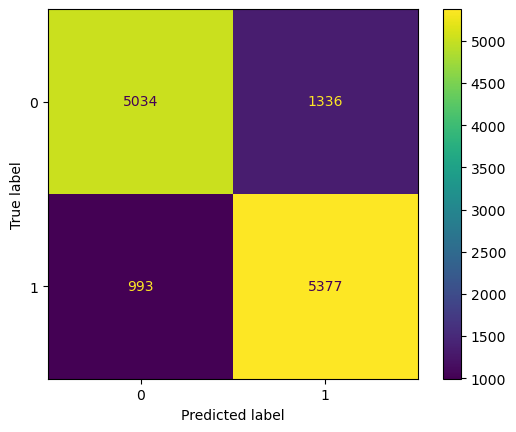

matrix for test : 



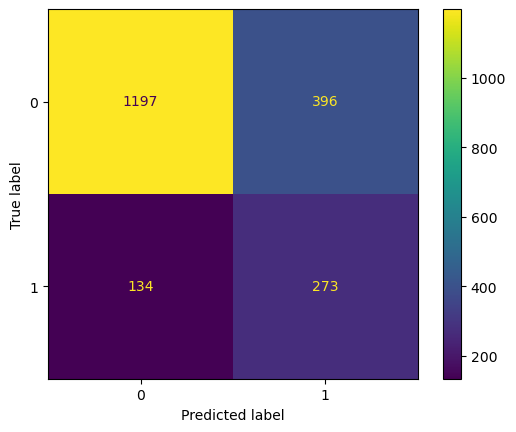

------------------------------
SVC
Training set pred accuracy :  82.0 %
Test set  pred accuracy :  79.0 %
              precision    recall  f1-score   support

          No     0.8131    0.8235    0.8183      6370
         Yes     0.8212    0.8107    0.8159      6370

    accuracy                         0.8171     12740
   macro avg     0.8172    0.8171    0.8171     12740
weighted avg     0.8172    0.8171    0.8171     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9187    0.8016    0.8562      1593
         Yes     0.4820    0.7224    0.5782       407

    accuracy                         0.7855      2000
   macro avg     0.7003    0.7620    0.7172      2000
weighted avg     0.8298    0.7855    0.7996      2000

Classification report for test set : 
 None
matrix for train : 



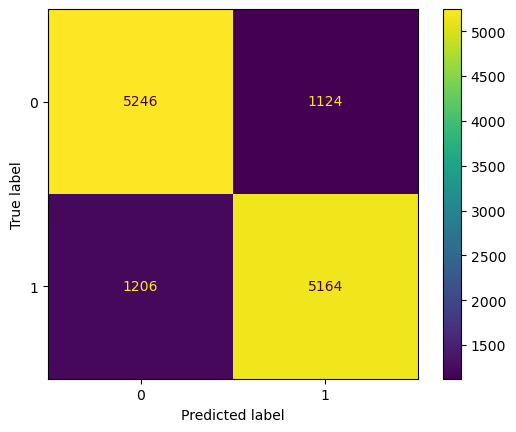

matrix for test : 



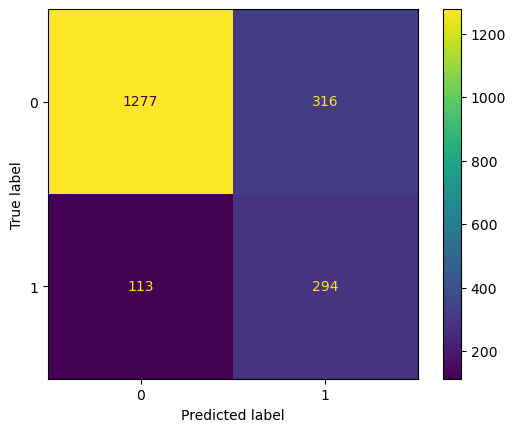

------------------------------
DT
Training set pred accuracy :  73.0 %
Test set  pred accuracy :  77.0 %
              precision    recall  f1-score   support

          No     0.6901    0.8209    0.7498      6370
         Yes     0.7790    0.6314    0.6975      6370

    accuracy                         0.7261     12740
   macro avg     0.7346    0.7261    0.7237     12740
weighted avg     0.7346    0.7261    0.7237     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.8993    0.8016    0.8477      1593
         Yes     0.4552    0.6486    0.5350       407

    accuracy                         0.7705      2000
   macro avg     0.6772    0.7251    0.6913      2000
weighted avg     0.8089    0.7705    0.7840      2000

Classification report for test set : 
 None
matrix for train : 



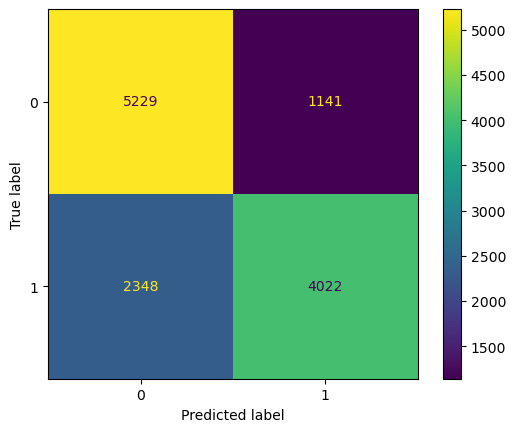

matrix for test : 



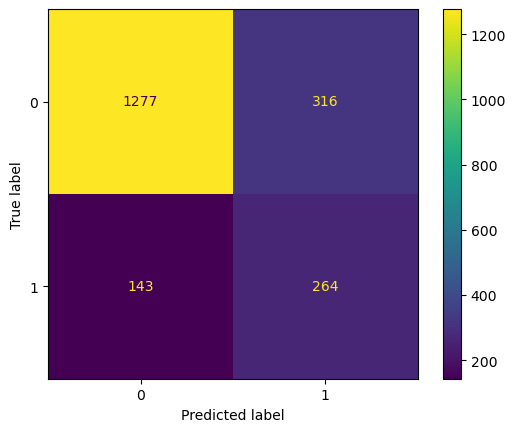

------------------------------
RF
Training set pred accuracy :  80.0 %
Test set  pred accuracy :  79.0 %
              precision    recall  f1-score   support

          No     0.7776    0.8278    0.8019      6370
         Yes     0.8159    0.7633    0.7887      6370

    accuracy                         0.7955     12740
   macro avg     0.7968    0.7955    0.7953     12740
weighted avg     0.7968    0.7955    0.7953     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9233    0.8085    0.8621      1593
         Yes     0.4959    0.7371    0.5929       407

    accuracy                         0.7940      2000
   macro avg     0.7096    0.7728    0.7275      2000
weighted avg     0.8363    0.7940    0.8073      2000

Classification report for test set : 
 None
matrix for train : 



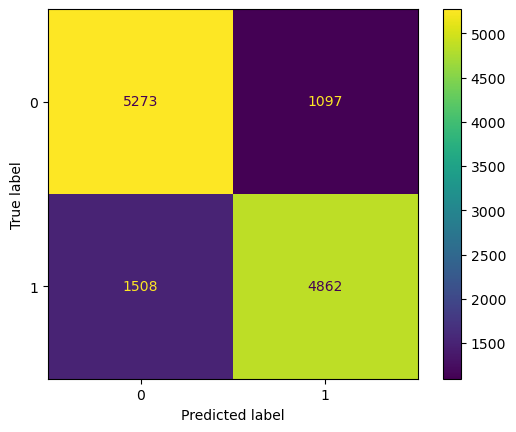

matrix for test : 



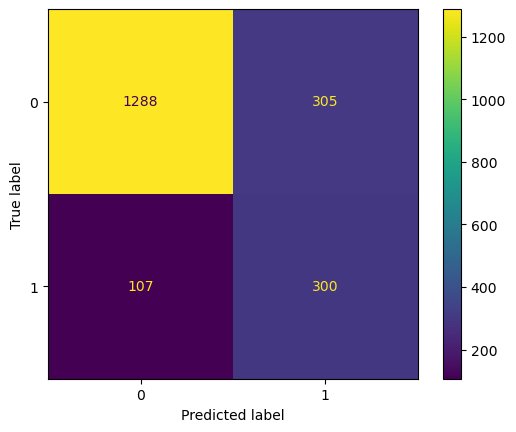

------------------------------
ADB
Training set pred accuracy :  78.0 %
Test set  pred accuracy :  78.0 %
              precision    recall  f1-score   support

          No     0.7638    0.7967    0.7799      6370
         Yes     0.7876    0.7537    0.7703      6370

    accuracy                         0.7752     12740
   macro avg     0.7757    0.7752    0.7751     12740
weighted avg     0.7757    0.7752    0.7751     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9252    0.7916    0.8532      1593
         Yes     0.4788    0.7494    0.5843       407

    accuracy                         0.7830      2000
   macro avg     0.7020    0.7705    0.7187      2000
weighted avg     0.8343    0.7830    0.7985      2000

Classification report for test set : 
 None
matrix for train : 



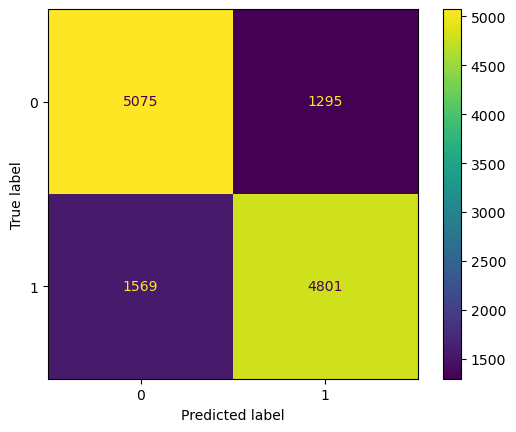

matrix for test : 



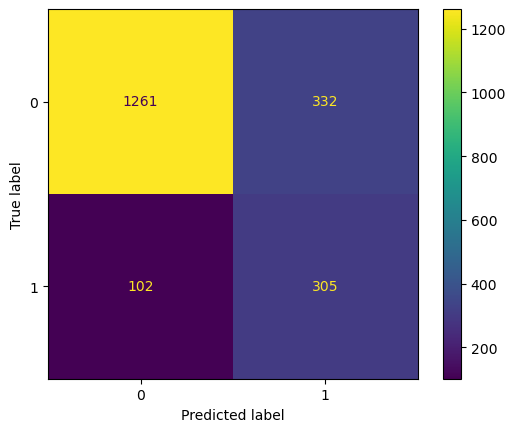

------------------------------
GB
Training set pred accuracy :  91.0 %
Test set  pred accuracy :  81.0 %
              precision    recall  f1-score   support

          No     0.9115    0.9011    0.9063      6370
         Yes     0.9022    0.9126    0.9074      6370

    accuracy                         0.9068     12740
   macro avg     0.9069    0.9068    0.9068     12740
weighted avg     0.9069    0.9068    0.9068     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9139    0.8462    0.8787      1593
         Yes     0.5333    0.6880    0.6009       407

    accuracy                         0.8140      2000
   macro avg     0.7236    0.7671    0.7398      2000
weighted avg     0.8365    0.8140    0.8222      2000

Classification report for test set : 
 None
matrix for train : 



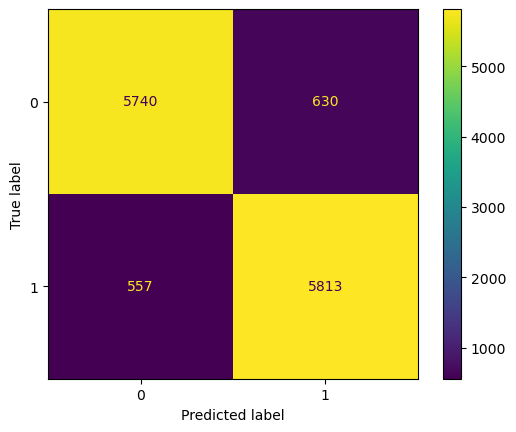

matrix for test : 



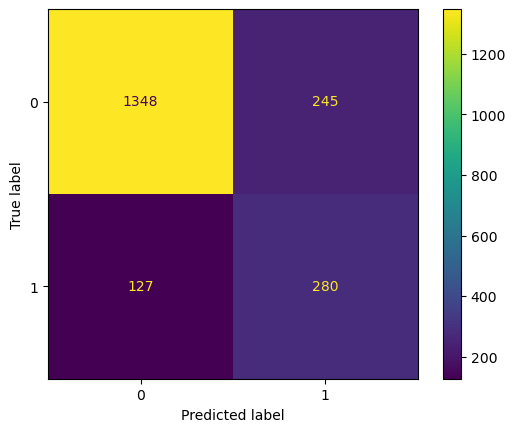

------------------------------
XGB
Training set pred accuracy :  80.0 %
Test set  pred accuracy :  80.0 %
              precision    recall  f1-score   support

          No     0.7926    0.8188    0.8055      6370
         Yes     0.8126    0.7857    0.7989      6370

    accuracy                         0.8023     12740
   macro avg     0.8026    0.8023    0.8022     12740
weighted avg     0.8026    0.8023    0.8022     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9337    0.8041    0.8641      1593
         Yes     0.5032    0.7764    0.6106       407

    accuracy                         0.7985      2000
   macro avg     0.7184    0.7903    0.7374      2000
weighted avg     0.8461    0.7985    0.8125      2000

Classification report for test set : 
 None
matrix for train : 



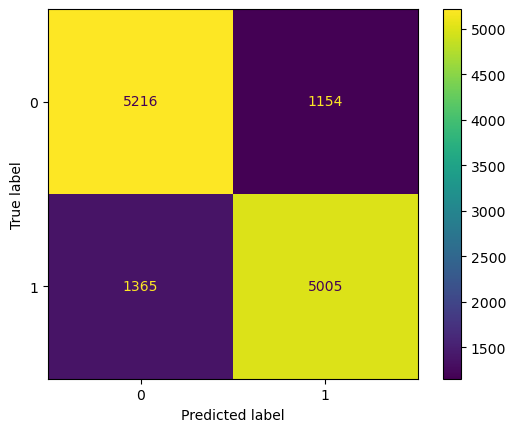

matrix for test : 



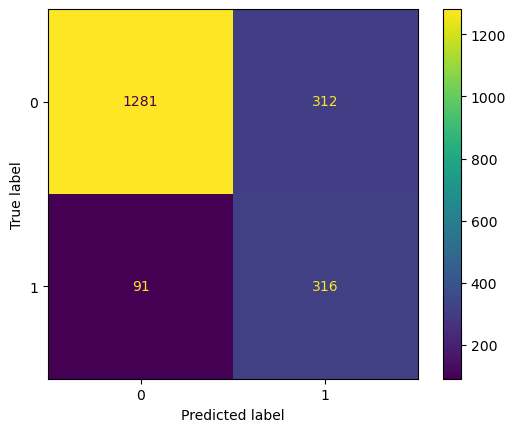

------------------------------


In [56]:
for model in Models:
    
    model[1].fit(x_train , y_train)
    
    y_train_pred = model[1].predict(x_train)
    y_test_pred = model[1].predict(x_test)
    train_acc = accuracy_score(y_true=y_train , y_pred=y_train_pred)
    test_acc = accuracy_score(y_true=y_test , y_pred=y_test_pred)
    print(model[0])
    print("Training set pred accuracy : ",np.around(train_acc,2)* 100,'%' )
    print("Test set  pred accuracy : ",np.around(test_acc,2)* 100,'%')
    print("Classification report for training set : \n",print(classification_report(y_true=y_train, y_pred=y_train_pred, target_names=['No','Yes'], digits=4)))
    print("Classification report for test set : \n",print(classification_report(y_true=y_test, y_pred=y_test_pred, target_names=['No','Yes'], digits=4)))
    print('matrix for train : \n')
    ConfusionMatrixDisplay(confusion_matrix(y_true=y_train , y_pred=y_train_pred)).plot()
    plt.show()
    print('matrix for test : \n')
    ConfusionMatrixDisplay(confusion_matrix(y_true=y_test , y_pred=y_test_pred)).plot()
    plt.show()
    print('-'*30)   

In [58]:
#draw the dt
dt=DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=3,min_samples_split=2,min_samples_leaf=1,random_state=0)
dt.fit(x_train , y_train)
y_train_pred = dt.predict(x_train)
y_test_pred = dt.predict(x_test)
plt.figure(figsize=(100 , 100))
_ = plot_tree(dt )
plt.show()

Training set pred accuracy :  80.0 %
Test set  pred accuracy :  79.0 %
              precision    recall  f1-score   support

          No     0.7776    0.8278    0.8019      6370
         Yes     0.8159    0.7633    0.7887      6370

    accuracy                         0.7955     12740
   macro avg     0.7968    0.7955    0.7953     12740
weighted avg     0.7968    0.7955    0.7953     12740

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9233    0.8085    0.8621      1593
         Yes     0.4959    0.7371    0.5929       407

    accuracy                         0.7940      2000
   macro avg     0.7096    0.7728    0.7275      2000
weighted avg     0.8363    0.7940    0.8073      2000

Classification report for test set : 
 None
matrix for train : 



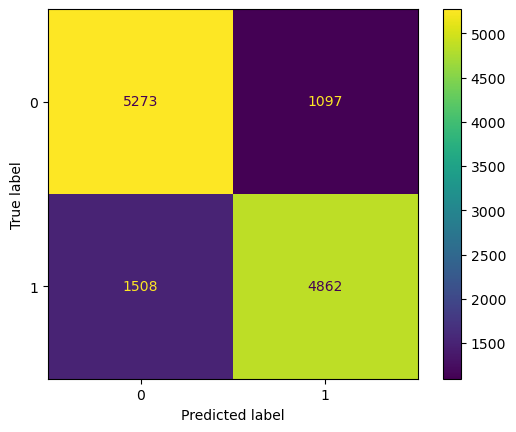

matrix for test : 



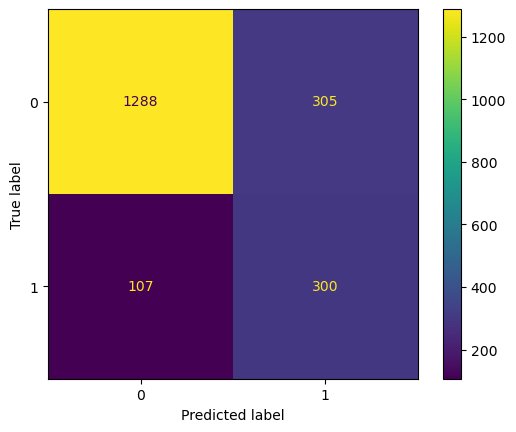

------------------------------


In [59]:
#the best model to be reused ---> Random Forest
#create rf object
rf=RandomForestClassifier(n_estimators=30, criterion='gini',max_depth=6,min_samples_split=8,min_samples_leaf=2,random_state=0)
rf.fit(x_train , y_train)
y_train_pred = rf.predict(x_train)
y_test_pred = rf.predict(x_test)
train_acc = accuracy_score(y_true=y_train , y_pred=y_train_pred)
test_acc = accuracy_score(y_true=y_test , y_pred=y_test_pred)
print("Training set pred accuracy : ",np.around(train_acc,2)* 100,'%' )
print("Test set  pred accuracy : ",np.around(test_acc,2)* 100,'%')
print("Classification report for training set : \n",print(classification_report(y_true=y_train, y_pred=y_train_pred, target_names=['No','Yes'], digits=4)))
print("Classification report for test set : \n",print(classification_report(y_true=y_test, y_pred=y_test_pred, target_names=['No','Yes'], digits=4)))
print('matrix for train : \n')
ConfusionMatrixDisplay(confusion_matrix(y_true=y_train , y_pred=y_train_pred)).plot()
plt.show()
print('matrix for test : \n')
ConfusionMatrixDisplay(confusion_matrix(y_true=y_test , y_pred=y_test_pred)).plot()
plt.show()
print('-'*30)       

In [62]:
#save and load our model
#save
import pickle
pickle.dump(rf, open('model.pkl', 'wb'))

In [63]:
#load the model
pickled_model = pickle.load(open('model.pkl', 'rb'))